In [1]:
%matplotlib inline  
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pylab
import re
import os, glob
from os import path
from wordcloud import WordCloud

In [2]:
path = r'/Users/WernerChao/Dropbox/Werner/Data_Science_Projects/kickstarter/data' # use your path
all_files = glob.glob(os.path.join(path, "*.csv"))
df_from_each_file = (pd.read_csv(f) for f in all_files)
data = pd.concat(df_from_each_file, ignore_index=True)

In [3]:
### Clean the JSON format for certain columns below:
import json

def parse_json(cell, key):
    try:
        return str(json.loads(cell)[key])
    except UnicodeEncodeError as e:
        print e
        print cell
        return json.loads(cell)[key]
    except TypeError as e:
        print e
        print cell
        return 'na'

In [4]:
### Create a new column 'cat' that is a json-cleaned version of column 'category'

category = map(parse_json, data.iloc[:]['category'], ['name']*len(data))
cat_slug = map(parse_json, data.iloc[:]['category'], ['slug']*len(data))

for i, item in enumerate(set(cat_slug)):
    print i+1, ':', item

data['cat'] = cat_slug
print len(data['cat'].unique())
data['cat'].unique()

1 : music/hip-hop
2 : publishing/children's books
3 : music/kids
4 : theater/immersive
5 : games/video games
6 : music/pop
7 : theater/experimental
8 : music/classical music
9 : film & video/drama
10 : film & video/shorts
11 : dance/performances
12 : music/rock
13 : technology/flight
14 : technology/fabrication tools
15 : comics/comic books
16 : music/latin
17 : technology/diy electronics
18 : music/electronic music
19 : technology/space exploration
20 : technology/makerspaces
21 : theater/plays
22 : technology/web
23 : technology/3d printing
24 : music/country & folk
25 : publishing/periodicals
26 : theater/comedy
27 : technology/hardware
28 : technology/robots
29 : publishing/literary journals
30 : publishing/art books
31 : publishing/translations
32 : technology/gadgets
33 : photography/photobooks
34 : technology/sound
35 : technology/camera equipment
36 : publishing/young adult
37 : theater/spaces
38 : film & video/narrative film
39 : publishing/radio & podcasts
40 : publishing/com

array(['publishing/academic', 'photography/places',
       'music/electronic music', 'music/country & folk',
       'music/classical music', 'music/blues', 'games/video games',
       'food/restaurants', 'film & video/webseries',
       'film & video/thrillers', 'film & video/shorts',
       'film & video/narrative film', 'technology/web', 'technology/apps',
       'technology/gadgets', 'technology/hardware', 'theater/festivals',
       'theater/plays', 'theater/musical', 'technology/flight',
       'technology/diy electronics', 'theater/spaces', 'theater/immersive',
       'theater/experimental', 'theater/comedy', 'technology/wearables',
       'technology/space exploration', 'technology/sound',
       'technology/software', 'technology/robots',
       'technology/makerspaces', 'technology/fabrication tools',
       'technology/camera equipment', 'publishing/young adult',
       'publishing/periodicals', 'publishing/fiction',
       "publishing/children's books", 'technology/3d printi

In [5]:
data.head(3)

,id,photo,name,blurb,goal,pledged,state,slug,disable_communication,country,...,category,profile,spotlight,urls,source_url,friends,is_starred,is_backing,permissions,cat
0,1454391034,"{""small"":""https://ksr-ugc.imgix.net/assets/011...",Auntie Di's Music Time Sign ASL for Hearing an...,MTS ASL Curriculum Workbook is a reproducible ...,1500.0,0.0,failed,auntie-dis-music-time-sign-asl-for-hearing-and...,False,US,...,"{""urls"":{""web"":{""discover"":""http://www.kicksta...","{""background_image_opacity"":0.8,""should_show_f...",False,"{""web"":{""project"":""https://www.kickstarter.com...",https://www.kickstarter.com/discover/categorie...,NaN,NaN,NaN,NaN,publishing/academic
1,1655206086,"{""small"":""https://ksr-ugc.imgix.net/assets/012...",Jump Start Kindergarten Toolkit,"This kit teaches how to print, correct an ugly...",500.0,0.0,failed,jump-start-kindergarten-toolkit,False,US,...,"{""urls"":{""web"":{""discover"":""http://www.kicksta...","{""background_image_opacity"":0.8,""should_show_f...",False,"{""web"":{""project"":""https://www.kickstarter.com...",https://www.kickstarter.com/discover/categorie...,NaN,NaN,NaN,NaN,publishing/academic
2,311581827,"{""small"":""https://ksr-ugc.imgix.net/assets/012...",Ojukwu Balewa Awolowo (O.B.A.) Public Library ...,"Establishing a free, world-class, public libra...",100000.0,120.0,failed,ojukwu-balewa-awolowo-oba-public-library-of-ni...,False,US,...,"{""urls"":{""web"":{""discover"":""http://www.kicksta...","{""background_image_opacity"":0.8,""should_show_f...",False,"{""web"":{""project"":""https://www.kickstarter.com...",https://www.kickstarter.com/discover/categorie...,NaN,NaN,NaN,NaN,publishing/academic


In [6]:
def cat_blurb(category):
    text = data[data['cat'] == category]['blurb'].values

    category_re = re.sub('./', '_', category)
    np.savetxt(
        r'/Users/WernerChao/Dropbox/Werner/Data_Science_Projects/kickstarter/blurb/{}_blurb.txt'.format(category_re), \
        text, fmt='%s')


_ = map(cat_blurb, data['cat'].unique())

In [7]:
def make_wordcloud(category):
    # Read the whole text.
    category_re = re.sub('./', '_', category)
    text = open('/Users/WernerChao/Dropbox/Werner/Data_Science_Projects/kickstarter/blurb/{}_blurb.txt'.format(category_re)).read()

    # Generate a word cloud image
    wordcloud = WordCloud().generate(text)

    # Display the generated image:
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig('{}: Word Cloud_1'.format(category_re))

    # lower max_font_size
    wordcloud = WordCloud(max_font_size=40).generate(text)
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.savefig('{}: Word Cloud_2'.format(category_re))
    plt.show()

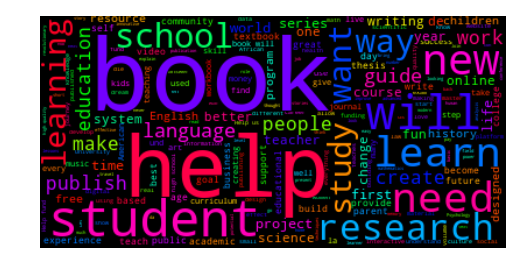

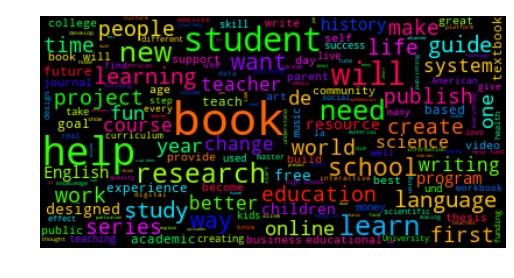

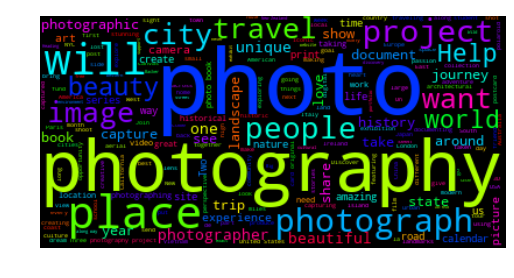

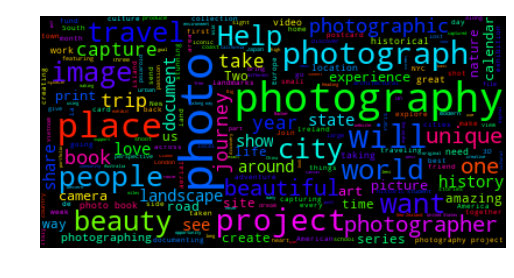

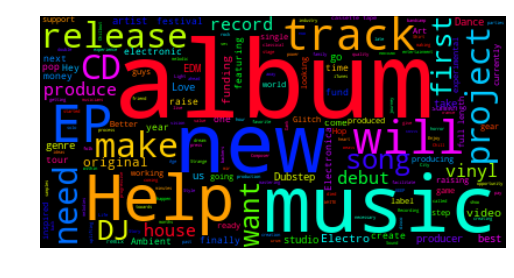

...

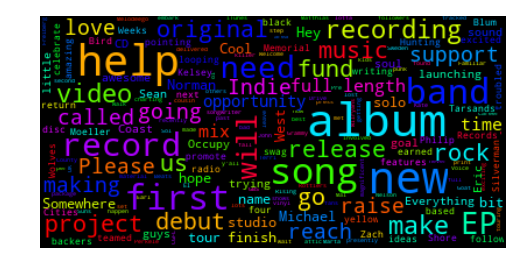

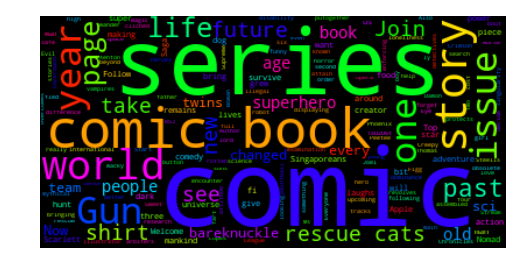

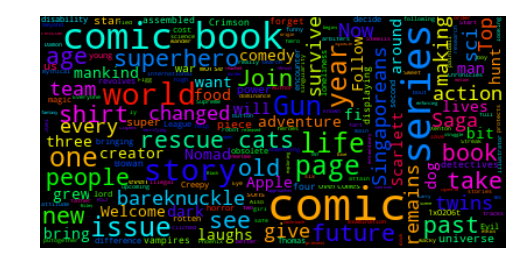

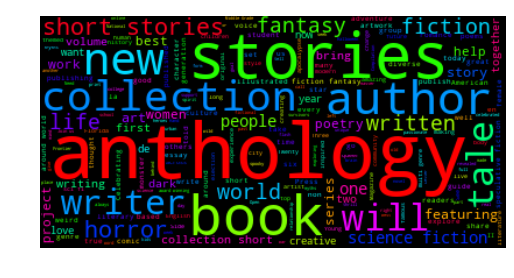

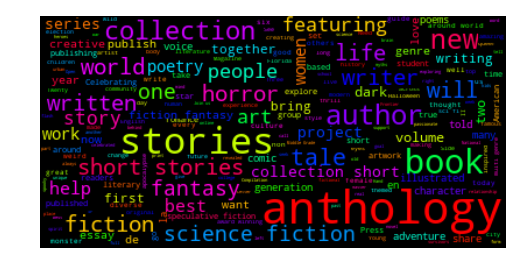

In [8]:
_ = map(make_wordcloud, data['cat'].unique())

In [ ]:
data['cat'].unique()